###  Importing Libraries and  Dataset

In [5281]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error,r2_score

In [5282]:
#to display all the rows and columns fully
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5283]:
#Reading the csv file
df = pd.read_csv("./train.csv", sep=",")

In [5284]:
#Checking the data
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5285]:
##checking the number of rows and columns in the dataset
df.shape

(1460, 81)

In [5286]:
# checking if is any null value in the dataset
round(df.isnull().sum()/len(df.index), 2)*100

Id                 0.0
MSSubClass         0.0
MSZoning           0.0
LotFrontage       18.0
LotArea            0.0
Street             0.0
Alley             94.0
LotShape           0.0
LandContour        0.0
Utilities          0.0
LotConfig          0.0
LandSlope          0.0
Neighborhood       0.0
Condition1         0.0
Condition2         0.0
BldgType           0.0
HouseStyle         0.0
OverallQual        0.0
OverallCond        0.0
YearBuilt          0.0
YearRemodAdd       0.0
RoofStyle          0.0
RoofMatl           0.0
Exterior1st        0.0
Exterior2nd        0.0
MasVnrType         1.0
MasVnrArea         1.0
ExterQual          0.0
ExterCond          0.0
Foundation         0.0
BsmtQual           3.0
BsmtCond           3.0
BsmtExposure       3.0
BsmtFinType1       3.0
BsmtFinSF1         0.0
BsmtFinType2       3.0
BsmtFinSF2         0.0
BsmtUnfSF          0.0
TotalBsmtSF        0.0
Heating            0.0
HeatingQC          0.0
CentralAir         0.0
Electrical         0.0
1stFlrSF   

In [5287]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

###  Data Analysis
#### Data Cleaning

In [5288]:
# Removing colums with null values
df = df.drop('Alley', axis=1)
df = df.drop('PoolQC', axis=1)
df = df.drop('MiscFeature', axis=1)

In [5289]:
#Converting NA to none in columns
df['FireplaceQu'] = df['FireplaceQu'].fillna('none')
df['Fence'] = df['Fence'].fillna('none')
df['BsmtQual'] = df['BsmtQual'].fillna('none')
df['BsmtCond'] = df['BsmtCond'].fillna('none')
df['BsmtExposure'] = df['BsmtExposure'].fillna('none')
df['BsmtFinType1'] = df['BsmtFinType1'].fillna('none')
df['BsmtFinType2'] = df['BsmtFinType2'].fillna('none')
df['GarageType'] = df['GarageType'].fillna('none')
df['GarageFinish'] = df['GarageFinish'].fillna('none')
df['GarageQual'] = df['GarageQual'].fillna('none')
df['GarageCond'] = df['GarageCond'].fillna('none')

In [5290]:
#converting na values of numeric data to its median value  
df['LotFrontage'] = df['LotFrontage'].fillna(df['LotFrontage'].median())
df['MasVnrArea'] = df['MasVnrArea'].fillna(df['MasVnrArea'].median())
df['GarageYrBlt'] = df['GarageYrBlt'].fillna(df['GarageYrBlt'].median())

In [5291]:
#converting na values of categorical data to its median value  
df['MasVnrType'] = df['MasVnrType'].fillna(df['MasVnrType'].mode()[0])


In [5292]:
#removing Id column as it is not required
df.drop('Id', axis=1,inplace=True)

In [5293]:
round(df.isnull().sum()/len(df.index), 2)*100

MSSubClass       0.0
MSZoning         0.0
LotFrontage      0.0
LotArea          0.0
Street           0.0
LotShape         0.0
LandContour      0.0
Utilities        0.0
LotConfig        0.0
LandSlope        0.0
Neighborhood     0.0
Condition1       0.0
Condition2       0.0
BldgType         0.0
HouseStyle       0.0
OverallQual      0.0
OverallCond      0.0
YearBuilt        0.0
YearRemodAdd     0.0
RoofStyle        0.0
RoofMatl         0.0
Exterior1st      0.0
Exterior2nd      0.0
MasVnrType       0.0
MasVnrArea       0.0
ExterQual        0.0
ExterCond        0.0
Foundation       0.0
BsmtQual         0.0
BsmtCond         0.0
BsmtExposure     0.0
BsmtFinType1     0.0
BsmtFinSF1       0.0
BsmtFinType2     0.0
BsmtFinSF2       0.0
BsmtUnfSF        0.0
TotalBsmtSF      0.0
Heating          0.0
HeatingQC        0.0
CentralAir       0.0
Electrical       0.0
1stFlrSF         0.0
2ndFlrSF         0.0
LowQualFinSF     0.0
GrLivArea        0.0
BsmtFullBath     0.0
BsmtHalfBath     0.0
FullBath     

In [5294]:
df.shape

(1460, 77)

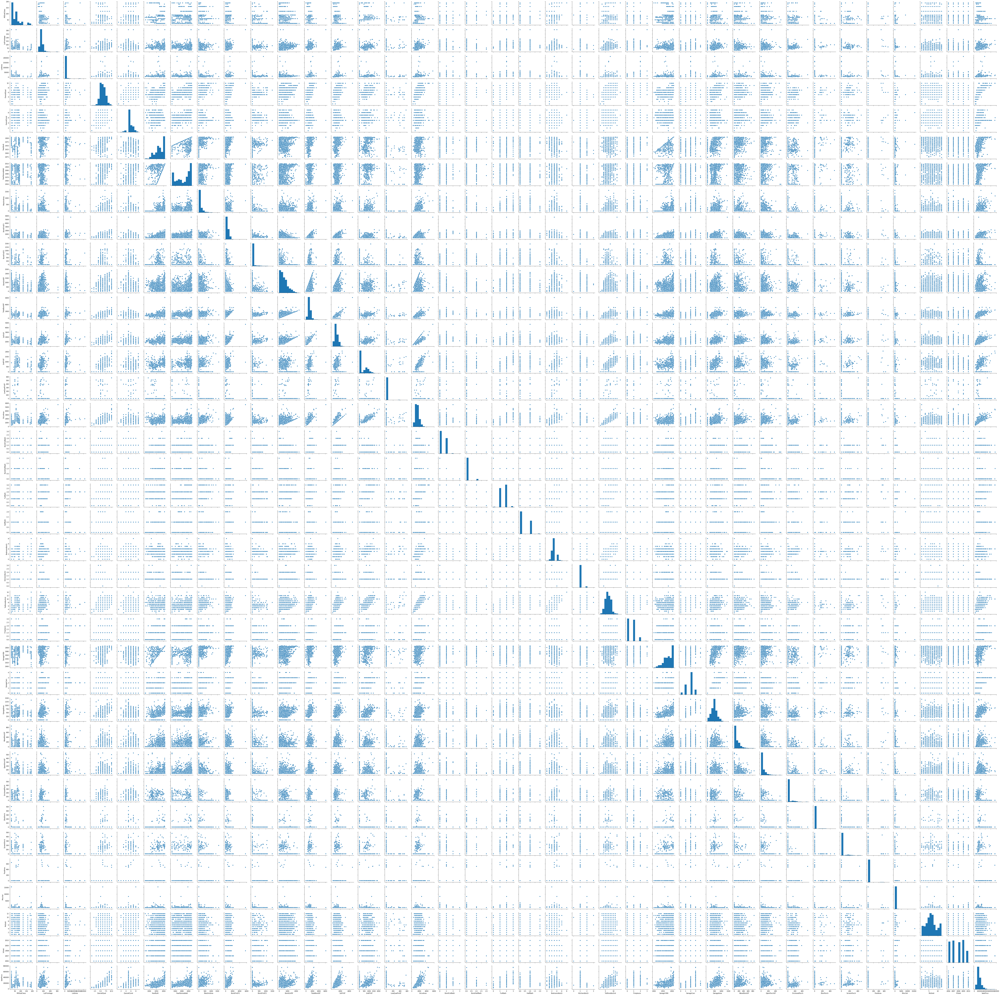

In [5295]:
#plotting scattered plot to check if the Linear Regression can be applied or not
sns.pairplot(df)
plt.show()

###  EDA
#### Univariate Analysis

In [5296]:
#checking data type of the column
#df.SaleType.dtype

In [5297]:
#Converting the dtatatype from int to object as it is a categorical data
df['MSSubClass'] = df['MSSubClass'].astype(str)
df['OverallQual'] = df['OverallQual'].astype(str)
df['OverallCond'] = df['OverallCond'].astype(str)
df['MasVnrType'] = df['MasVnrType'].astype(str)
df['BsmtFullBath'] = df['BsmtFullBath'].astype(str)
df['FullBath'] = df['FullBath'].astype(str)
df['HalfBath'] = df['HalfBath'].astype(str)
df['BedroomAbvGr'] = df['BedroomAbvGr'].astype(str)
df['TotRmsAbvGrd'] = df['TotRmsAbvGrd'].astype(str)
df['Fireplaces'] = df['Fireplaces'].astype(str)
df['GarageCars'] = df['GarageCars'].astype(str)
df['MoSold'] = df['MoSold'].astype(str)

In [5298]:
#Checking how the data is distributed 
#(df['SaleCondition'].value_counts()/df.shape[0])*100

In [5299]:
#Removing highly skewed (more than 80%) as it will not provide any information in the analysis
df.drop('Street', axis=1,inplace=True)
df.drop('Utilities', axis=1,inplace=True)
df.drop('LandSlope', axis=1,inplace=True)
df.drop('LandContour', axis=1,inplace=True)
df.drop('Condition2', axis=1,inplace=True)
df.drop('RoofMatl', axis=1,inplace=True)
df.drop('BsmtCond', axis=1,inplace=True)
df.drop('BsmtFinType2', axis=1,inplace=True)
df.drop('Heating', axis=1,inplace=True)
df.drop('CentralAir', axis=1,inplace=True)
df.drop('Electrical', axis=1,inplace=True)
df.drop('BsmtHalfBath', axis=1,inplace=True)
df.drop('KitchenAbvGr', axis=1,inplace=True)
df.drop('Functional', axis=1,inplace=True)
df.drop('GarageQual', axis=1,inplace=True)
df.drop('GarageCond', axis=1,inplace=True)
df.drop('PavedDrive', axis=1,inplace=True)
df.drop('3SsnPorch', axis=1,inplace=True)
df.drop('ScreenPorch', axis=1,inplace=True)
df.drop('PoolArea', axis=1,inplace=True)
df.drop('MiscVal', axis=1,inplace=True)
df.drop('SaleType', axis=1,inplace=True)
df.drop('Condition1', axis=1,inplace=True)


In [5300]:
#Changing YearBuilt to NoOfYear
df['YearBuilt'] = 2020 - df['YearBuilt']

#renaming the column YearBuilt to NoOfYears
df.rename(columns = {'YearBuilt':'NoOfYears'}, inplace = True)


In [5301]:
#Creating Bins for NoOfYears Column
year_bin =[10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]
df['bin_year'] = pd.cut(df['NoOfYears'],year_bin)

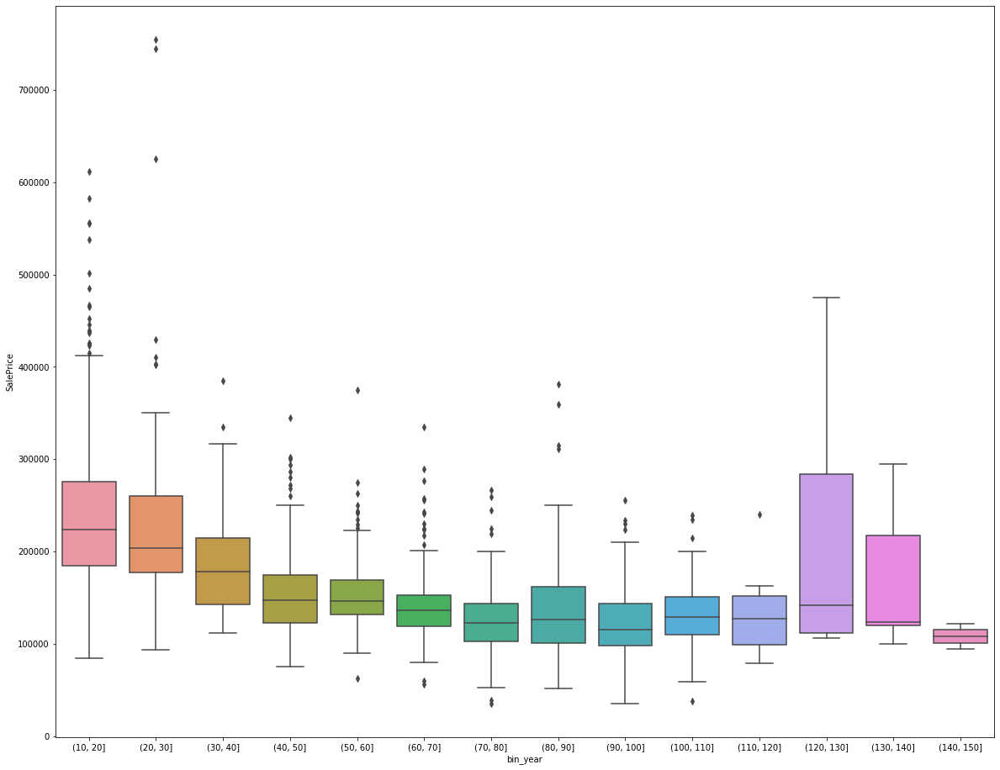

In [5302]:
plt.figure(figsize=(20, 16))
plt.subplot(1,1,1)
sns.boxplot(x = 'bin_year', y = 'SalePrice', data = df)

In [5303]:
#ChangingYearRemodAdd to NoRenod
df['YearRemodAdd'] = 2020 - df['YearRemodAdd']
#enaming the column YearBuilt to NoOfYears
df.rename(columns = {'YearRemodAdd':'NoRenod'}, inplace = True)
#Creating Bins for NoRenod Column
renod_bin =[10,20,30,40,50,60,70]
df['bin_renod'] = pd.cut(df['NoRenod'],renod_bin)

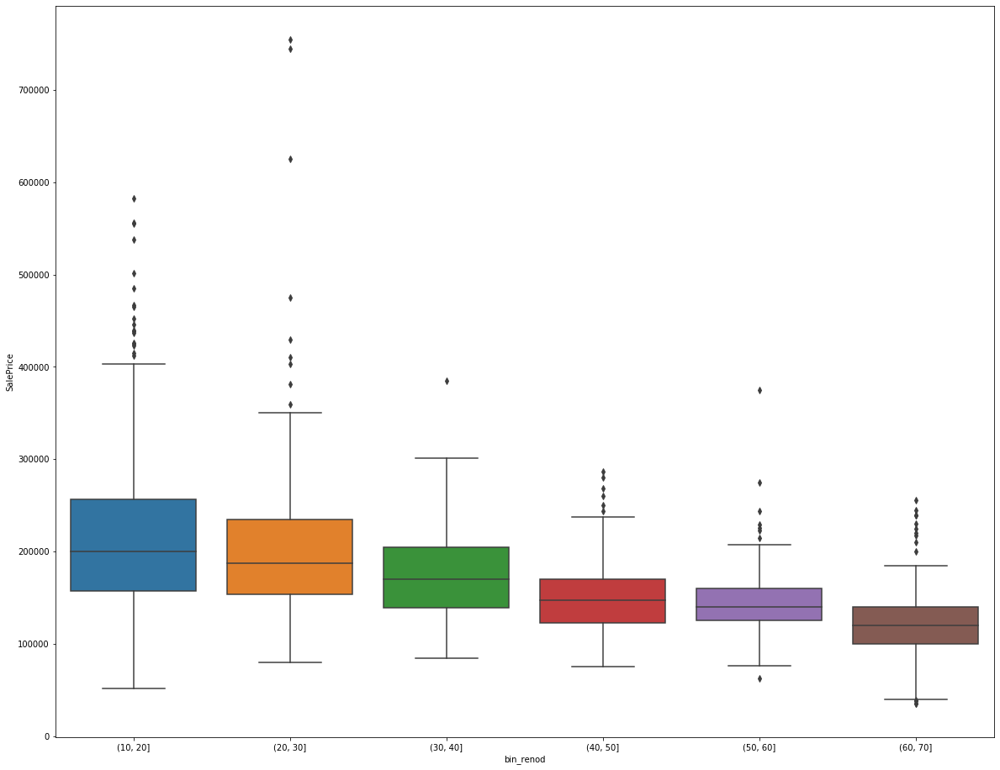

In [5304]:
plt.figure(figsize=(20, 16))
plt.subplot(1,1,1)
sns.boxplot(x = 'bin_renod', y = 'SalePrice', data = df)

In [5305]:
#Subtracting current year and GarageyrBlt and YrSold
df['GarageYrBlt'] = 2020 - df['GarageYrBlt']
df['YrSold'] = 2020 - df['YrSold']

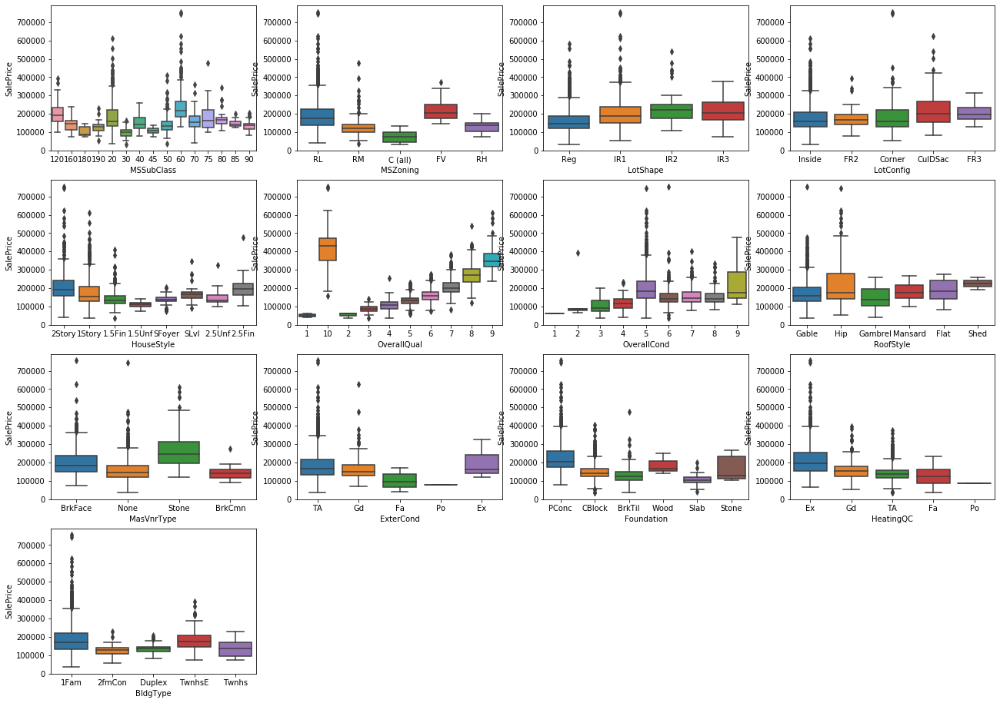

In [5306]:
#Plotting the categorical data versus output variable
plt.figure(figsize=(22, 16))

plt.subplot(4,4,1)
sns.boxplot(x = 'MSSubClass', y = 'SalePrice', data = df)
plt.subplot(4,4,2)
sns.boxplot(x = 'MSZoning', y = 'SalePrice', data = df)
plt.subplot(4,4,3)
sns.boxplot(x = 'LotShape', y = 'SalePrice', data = df)
plt.subplot(4,4,4)
sns.boxplot(x = 'LotConfig', y = 'SalePrice', data = df)
plt.subplot(4,4,5)
sns.boxplot(x = 'HouseStyle', y = 'SalePrice', data = df)
plt.subplot(4,4,6)
sns.boxplot(x = 'OverallQual', y = 'SalePrice', data = df)
plt.subplot(4,4,7)
sns.boxplot(x = 'OverallCond', y = 'SalePrice', data = df)
plt.subplot(4,4,8)
sns.boxplot(x = 'RoofStyle', y = 'SalePrice', data = df)
plt.subplot(4,4,9)
sns.boxplot(x = 'MasVnrType', y = 'SalePrice', data = df)
plt.subplot(4,4,10)
sns.boxplot(x = 'ExterCond', y = 'SalePrice', data = df)
plt.subplot(4,4,11)
sns.boxplot(x = 'Foundation', y = 'SalePrice', data = df)
plt.subplot(4,4,12)
sns.boxplot(x = 'HeatingQC', y = 'SalePrice', data = df)
plt.subplot(4,4,13)
sns.boxplot(x = 'BldgType', y = 'SalePrice', data = df)

#### Analysis
we can see that in MSSubClass the 2 story 1945 (older) have highest saleprice compared to others <br>
Two hlf story and 2 story have same median range and these two are higher than the rest Median values <br>
Moderately irrelugar has higher saleprice compared to others <br>
The Very Good Quality type has very high sale price <br>
Moderate Overall Condition has higher saleprice <br>
Excellent Heating Qc has higher sale price

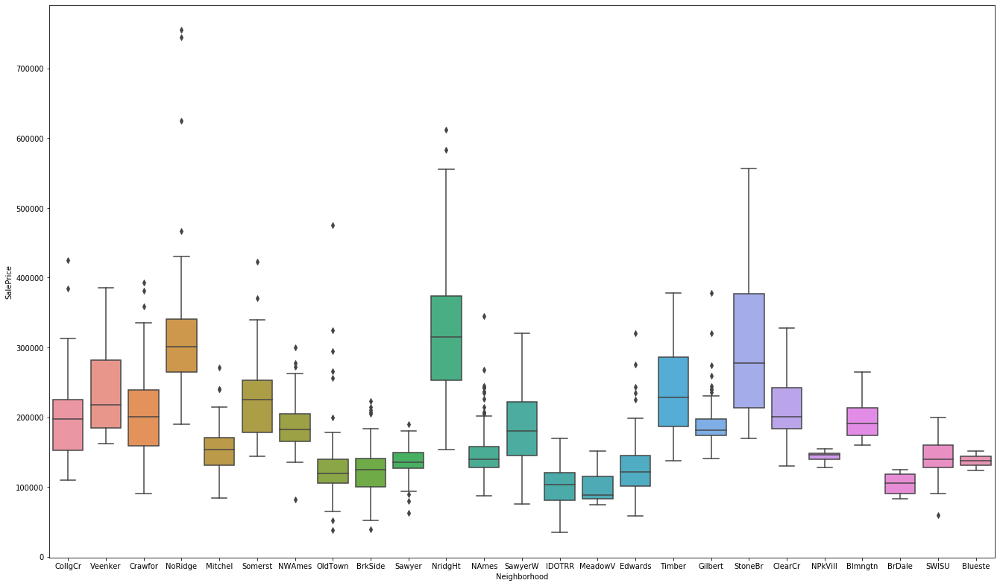

In [5307]:
plt.figure(figsize=(50, 30))
plt.subplot(2,2,1)
sns.boxplot(x = 'Neighborhood', y = 'SalePrice', data = df)

#### Analysis
NrindgHt is the costliest Neighborhood followed by and NoRidge and StoneBr 

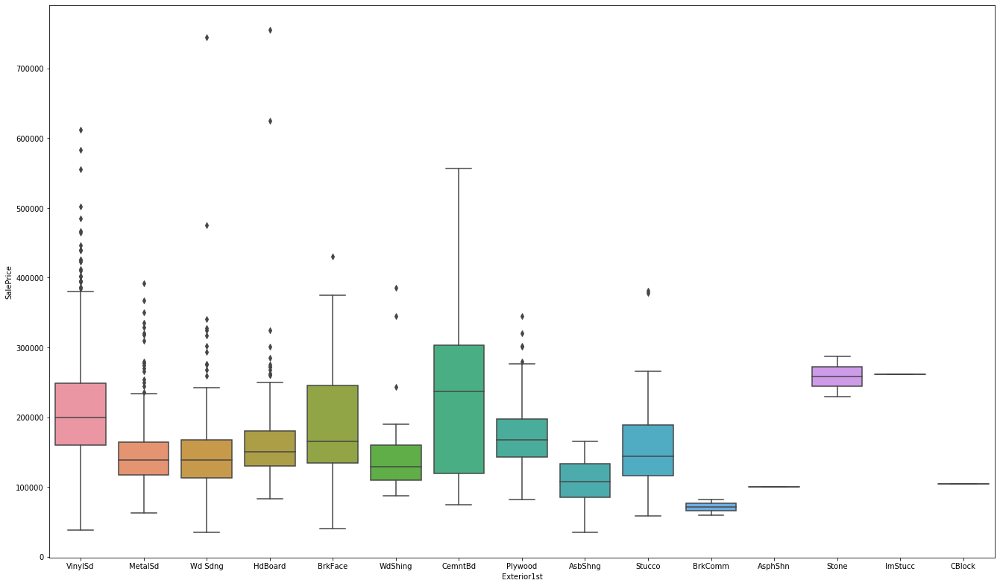

In [5308]:
plt.figure(figsize=(50, 30))
plt.subplot(2,2,1)
sns.boxplot(x = 'Exterior1st', y = 'SalePrice', data = df)

#### Analysis
CementBd Exterior has higher SalePrice compared to other build

In [5309]:
#Removing the bins which where created 
df.drop('bin_year',axis=1, inplace = True)
df.drop('bin_renod',axis=1, inplace = True)

In [5310]:
#Reomoving Numeric skewed data
df.drop('LowQualFinSF',axis=1, inplace = True)
df.drop('BsmtFinSF2',axis=1, inplace = True)

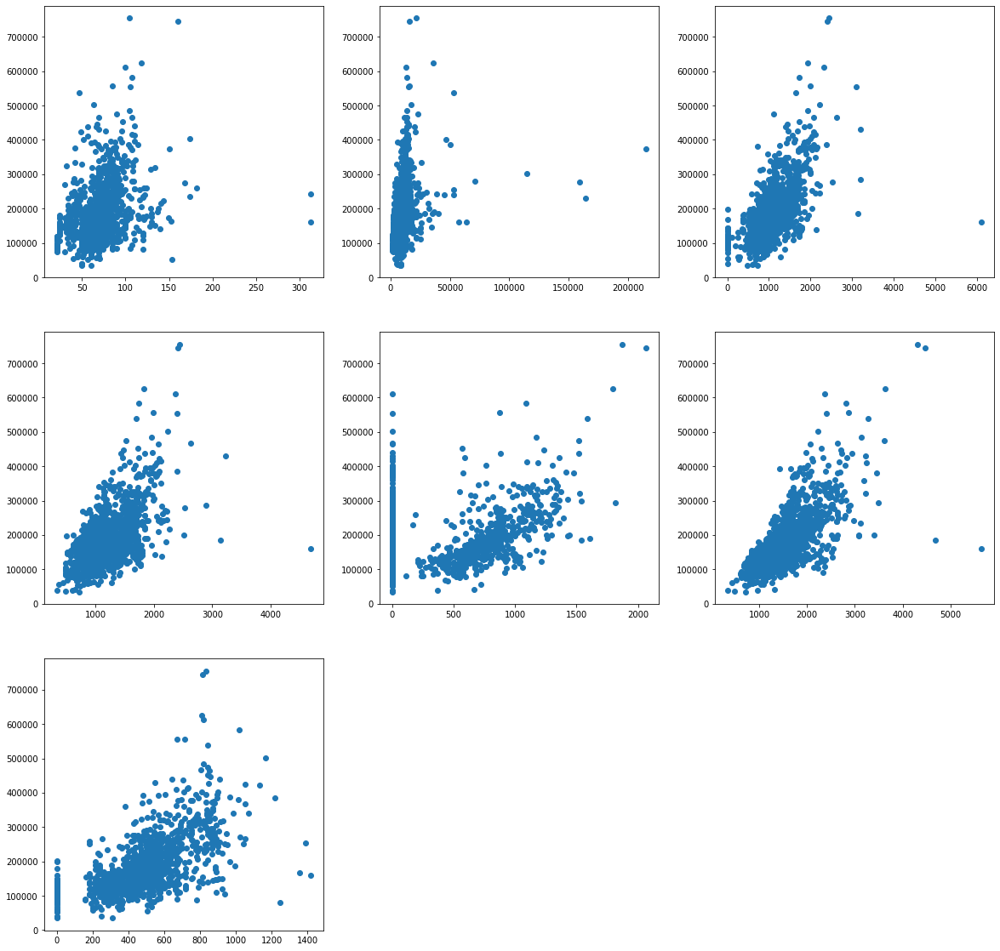

In [5311]:
#plotting the discrete variables versus output variable
plt.figure(figsize=(20,20))
plt.subplot(3,3,1)
plt.scatter(df['LotFrontage'],df['SalePrice'])
plt.subplot(3,3,2)
plt.scatter(df['LotArea'],df['SalePrice'])
plt.subplot(3,3,3)
plt.scatter(df['TotalBsmtSF'],df['SalePrice'])
plt.subplot(3,3,4)
plt.scatter(df['1stFlrSF'],df['SalePrice'])
plt.subplot(3,3,5)
plt.scatter(df['2ndFlrSF'],df['SalePrice'])
plt.subplot(3,3,6)
plt.scatter(df['GrLivArea'],df['SalePrice'])
plt.subplot(3,3,7)
plt.scatter(df['GarageArea'],df['SalePrice'])

#### Bivariate Analysis

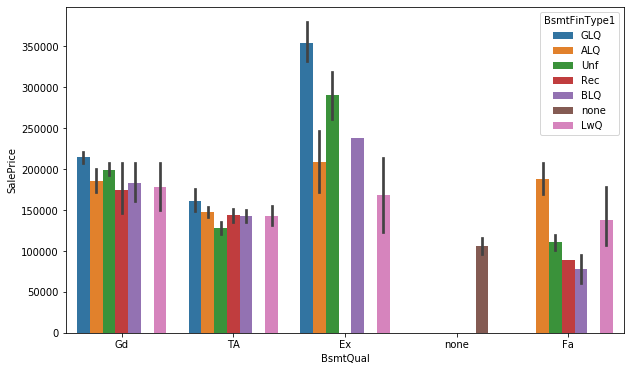

In [5312]:
#Plotting graph for more than 2 catogiracl data together

plt.figure(figsize=(10, 6))
sns.barplot(x='BsmtQual', y='SalePrice', hue='BsmtFinType1', data=df)
plt.show()

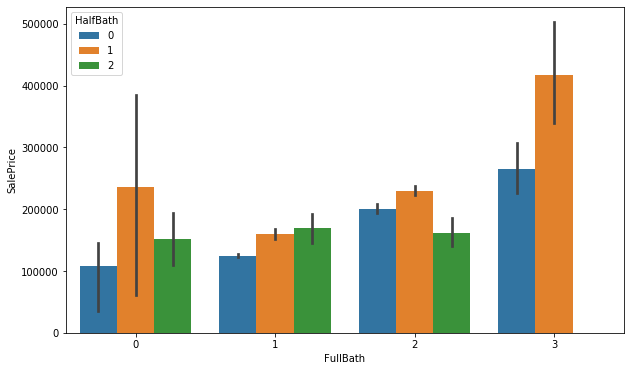

In [5313]:
plt.figure(figsize=(10, 6))
sns.barplot(x='FullBath', y='SalePrice', hue='HalfBath', data=df)
plt.show()

In [5314]:
#Removing few more variables as it does not affect the SalePrice
#cols = ['MoSold','YrSold']
#df=df.drop(cols,axis=1)
#df.shape


#### Transformation of Target Variable

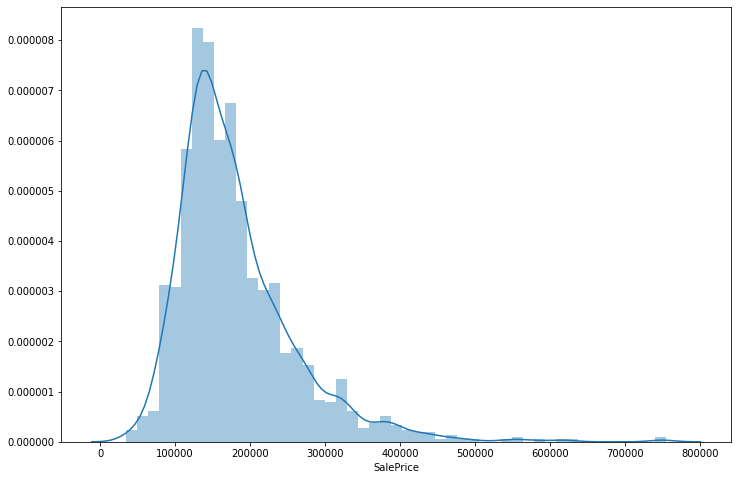

In [5315]:
#checking the distribution of the target/putput variable
plt.figure(figsize=(12,8))
plt.subplot(1,1,1)
sns.distplot(df['SalePrice'])

As we can see the target variable is left skewed and as a condition of Linear regression, the variables should be normally distributed. So now, we need to do Log transformation to make it normally distributed.

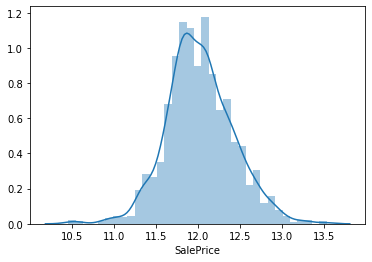

In [5316]:
#Target/Output variable after Log transformation

df['SalePrice'] = np.log1p(df['SalePrice'])

sns.distplot(df['SalePrice'])
plt.show()

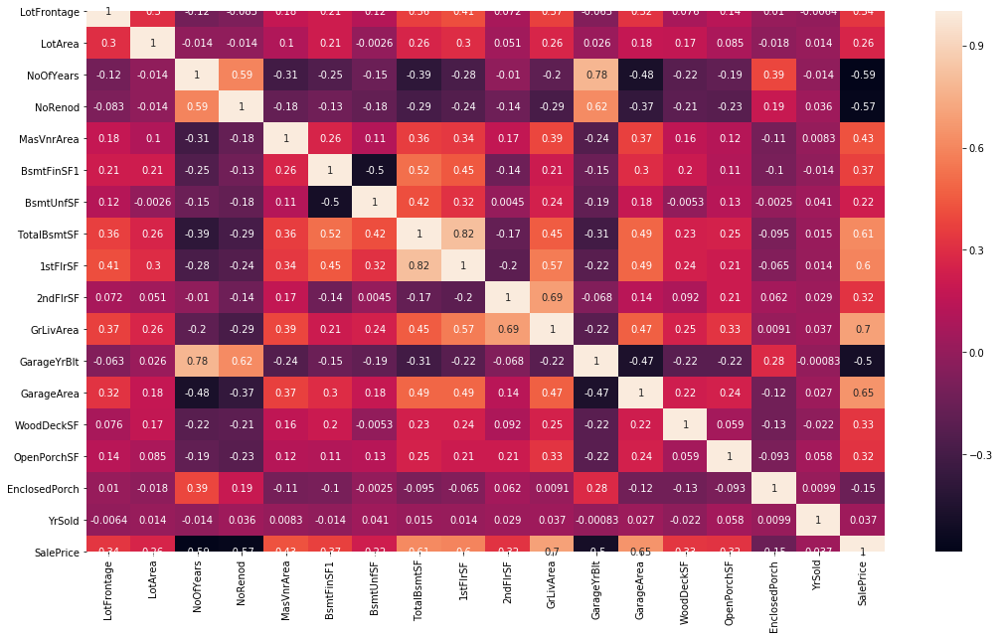

In [5317]:
#plotting corelation graph
plt.figure(figsize = (18,10))
sns.heatmap(df.corr(),annot = True)

#### Analysis
We can see that TotalbsmtSF and 1stFlrSF has 82% which is very high, we can remove any one these <br>
Even GarageYrBlt and NoOfYears have 78% of colinearity

In [5318]:
df.drop('1stFlrSF', axis=1, inplace = True)
df.drop('GarageYrBlt', axis=1, inplace = True)

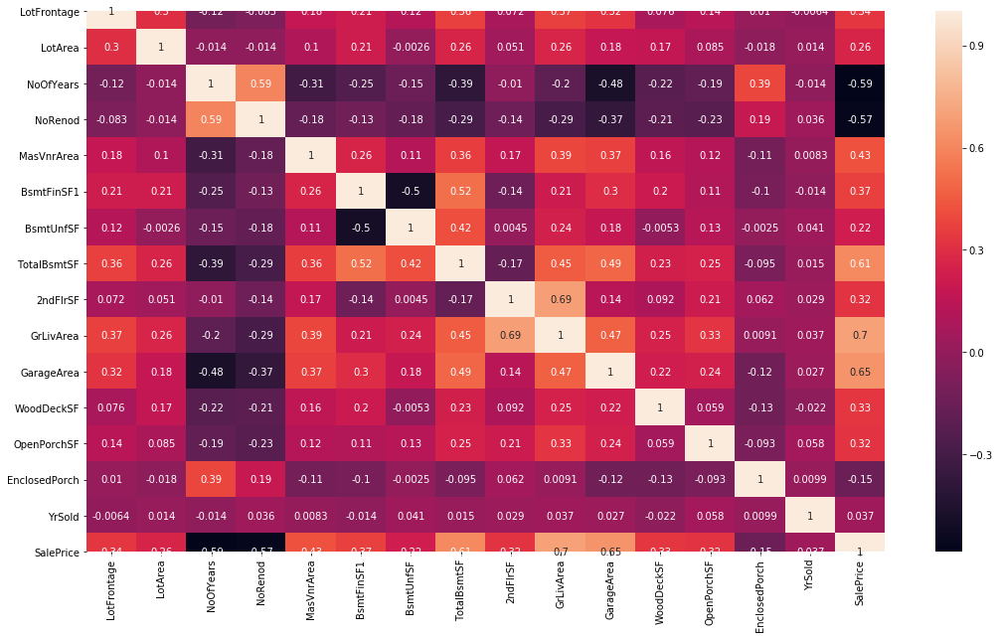

In [5319]:
#plotting corelation graph
plt.figure(figsize = (18,10))
sns.heatmap(df.corr(),annot = True)

In [5320]:
df.shape

(1460, 50)

#### Dummy variable

In [5321]:
#Checking all the categorical columns
cat = list(df.select_dtypes(['object']).columns)
print(cat)

['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars', 'Fence', 'MoSold', 'SaleCondition']


In [5322]:
# Creating dummy variables for variables with more than 2 categories
df= pd.get_dummies(df,columns = ['MSSubClass','MSZoning','LotShape','LotConfig','Neighborhood','HouseStyle','OverallQual','OverallCond','RoofStyle','Exterior1st','Exterior2nd','MasVnrType', 'ExterQual','Foundation','BsmtQual','BsmtExposure','BsmtFinType1','HeatingQC','BsmtFullBath','FullBath','HalfBath','BedroomAbvGr','KitchenQual','TotRmsAbvGrd','Fireplaces','FireplaceQu','GarageType','GarageFinish','GarageCars','MoSold','Fence','BldgType','ExterCond','SaleCondition'],
                  prefix = ['MSSubClass','MSZoning','LotShape','LotConfig','Neighborhood','HouseStyle','OverallQual','OverallCond','RoofStyle','Exterior1st','Exterior2nd', 'MasVnrType', 'ExterQual','Foundation','BsmtQual','BsmtExposure','BsmtFinType1','HeatingQC','BsmtFullBath','FullBath','HalfBath','BedroomAbvGr','KitchenQual','TotRmsAbvGrd','Fireplaces','FireplaceQu','GarageType','GarageFinish','GarageCars','MoSold','Fence','BldgType','ExterCond','SaleCondition'])

In [5323]:
df.head()

,LotFrontage,LotArea,NoOfYears,NoRenod,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,YrSold,SalePrice,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_1,OverallQual_10,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallCond_1,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,BsmtFullBath_0,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,FullBath_0,FullBath_1,FullBath_2,FullBath_3,HalfBath_0,HalfBath_1,HalfBath_2,BedroomAbvGr_0,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,TotRmsAbvGrd_2,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,Fireplaces_0,Fireplaces_1,Fireplaces_2,Fireplaces_3,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,FireplaceQu_none,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageCars_0,GarageCars_1,GarageCars_2,GarageCars_3,GarageCars_4,MoSold_1,MoSold_10,MoSold_11,MoSold_12,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_none,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,SaleCondition_Abnorml,

In [5324]:
# Removing the least values from the dummy variables created
df.drop('MSSubClass_40', axis=1,inplace=True)
df.drop('MSZoning_C (all)', axis=1,inplace=True)
df.drop('Neighborhood_Blueste', axis=1,inplace=True)
df.drop('LotShape_IR3', axis=1,inplace=True)
df.drop('LotConfig_FR3', axis=1,inplace=True)
df.drop('BldgType_2fmCon', axis=1,inplace=True)
df.drop('HouseStyle_2.5Fin', axis=1,inplace=True)
df.drop('OverallQual_1', axis=1,inplace=True)
df.drop('OverallCond_1', axis=1,inplace=True)
df.drop('RoofStyle_Shed', axis=1,inplace=True)
df.drop('Exterior1st_ImStucc', axis=1,inplace=True)
df.drop('Exterior2nd_Other', axis=1,inplace=True)
df.drop('MasVnrType_BrkCmn', axis=1,inplace=True)
df.drop('ExterQual_Fa', axis=1,inplace=True)
df.drop('ExterCond_Po', axis=1,inplace=True)
df.drop('Foundation_Wood', axis=1,inplace=True)
df.drop('BsmtQual_Fa', axis=1,inplace=True)
df.drop('BsmtExposure_none', axis=1,inplace=True)
df.drop('BsmtFinType1_none', axis=1,inplace=True)
df.drop('HeatingQC_Po', axis=1,inplace=True)
df.drop('BsmtFullBath_3', axis=1,inplace=True)
df.drop('FullBath_0', axis=1,inplace=True)
df.drop('HalfBath_2', axis=1,inplace=True)
df.drop('BedroomAbvGr_8', axis=1,inplace=True)
df.drop('KitchenQual_Fa', axis=1,inplace=True)
df.drop('TotRmsAbvGrd_14', axis=1,inplace=True)
df.drop('Fireplaces_3', axis=1,inplace=True)
df.drop('FireplaceQu_Po', axis=1,inplace=True)
df.drop('GarageType_2Types', axis=1,inplace=True)
df.drop('GarageFinish_none', axis=1,inplace=True)
df.drop('GarageCars_4', axis=1,inplace=True)
df.drop('Fence_MnWw', axis=1,inplace=True)
df.drop('MoSold_2', axis=1,inplace=True)
#df.drop('SaleType_Con', axis=1,inplace=True)
df.drop('SaleCondition_AdjLand', axis=1,inplace=True)

In [5325]:
df.shape

(1460, 230)

#### Splitting into Training and Testing Data

In [5326]:
from sklearn.model_selection import train_test_split
np.random.seed(0)
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [5327]:
#Number of rows in train data 
df_train.shape


(1021, 230)

In [5328]:
#Number of rows in test data
df_test.shape

(438, 230)

In [5329]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [5330]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [5331]:
# Checking all the numeric variables
num =  list(df.columns[df.dtypes != 'object'])
print(num)

['LotFrontage', 'LotArea', 'NoOfYears', 'NoRenod', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'YrSold', 'SalePrice', 'MSSubClass_120', 'MSSubClass_160', 'MSSubClass_180', 'MSSubClass_190', 'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_45', 'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75', 'MSSubClass_80', 'MSSubClass_85', 'MSSubClass_90', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR1', 'LotShape_IR2', 'LotShape_Reg', 'LotConfig_Corner', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_Inside', 'Neighborhood_Blmngtn', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'N

In [5332]:
# Applying scaler() to all the columns except the for dummy variables
number_var = ['LotFrontage','LotArea','NoOfYears','NoRenod','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','2ndFlrSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF','YrSold','EnclosedPorch','SalePrice']

df_train[number_var] = scaler.fit_transform(df_train[number_var])

In [5333]:
# for test data doing scaling
df_test[number_var] = scaler.transform(df_test[number_var])

In [5334]:
df_train.head()

,LotFrontage,LotArea,NoOfYears,NoRenod,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,YrSold,SalePrice,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_Reg,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_10,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Gd,ExterQual_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,BsmtQual_Ex,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,BsmtFullBath_0,BsmtFullBath_1,BsmtFullBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_0,HalfBath_1,BedroomAbvGr_0,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,KitchenQual_Ex,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_2,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,Fireplaces_0,Fireplaces_1,Fireplaces_2,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_none,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageCars_0,GarageCars_1,GarageCars_2,GarageCars_3,MoSold_1,MoSold_10,MoSold_11,MoSold_12,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_none,BldgType_1Fam,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,SaleCondition_Abnorml,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
210,0.157534,0.019306,0.615942,1.000000,0.00,0.082920,0.169521,0.141408,0.000000,0.081860,0.000000,0.000000,0.000000,0.173913,0.50,0.335847,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,

In [5335]:
df_train.describe()

,LotFrontage,LotArea,NoOfYears,NoRenod,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,YrSold,SalePrice,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_Reg,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_10,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Gd,ExterQual_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,BsmtQual_Ex,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,BsmtFullBath_0,BsmtFullBath_1,BsmtFullBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_0,HalfBath_1,BedroomAbvGr_0,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,KitchenQual_Ex,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_2,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,Fireplaces_0,Fireplaces_1,Fireplaces_2,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_none,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageCars_0,GarageCars_1,GarageCars_2,GarageCars_3,MoSold_1,MoSold_10,MoSold_11,MoSold_12,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_none,BldgType_1Fam,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,SaleCondition_Abnorml,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000

### Building Model

In [5336]:
y_train = df_train.pop('SalePrice')
X_train = df_train
y_test = df_test.pop('SalePrice')
X_test = df_test

#### RFE

In [5337]:
# Running RFE with the output number of the variable equal to 15
lm = LinearRegression()
lm.fit(X_train, y_train)

# running RFE
rfe = RFE(lm, 80)            
rfe = rfe.fit(X_train, y_train)

In [5338]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 21),
 ('LotArea', True, 1),
 ('NoOfYears', True, 1),
 ('NoRenod', False, 58),
 ('MasVnrArea', False, 117),
 ('BsmtFinSF1', False, 35),
 ('BsmtUnfSF', False, 119),
 ('TotalBsmtSF', False, 120),
 ('2ndFlrSF', False, 72),
 ('GrLivArea', True, 1),
 ('GarageArea', False, 73),
 ('WoodDeckSF', False, 52),
 ('OpenPorchSF', False, 127),
 ('EnclosedPorch', False, 79),
 ('YrSold', False, 128),
 ('MSSubClass_120', False, 24),
 ('MSSubClass_160', False, 133),
 ('MSSubClass_180', False, 111),
 ('MSSubClass_190', True, 1),
 ('MSSubClass_20', False, 25),
 ('MSSubClass_30', False, 32),
 ('MSSubClass_45', False, 26),
 ('MSSubClass_50', False, 29),
 ('MSSubClass_60', False, 33),
 ('MSSubClass_70', False, 28),
 ('MSSubClass_75', False, 27),
 ('MSSubClass_80', False, 30),
 ('MSSubClass_85', False, 31),
 ('MSSubClass_90', True, 1),
 ('MSZoning_FV', True, 1),
 ('MSZoning_RH', False, 2),
 ('MSZoning_RL', False, 3),
 ('MSZoning_RM', False, 4),
 ('LotShape_IR1', False, 96),
 ('LotShape_I

In [5339]:
col = X_train.columns[rfe.support_]
col

Index(['LotArea', 'NoOfYears', 'GrLivArea', 'MSSubClass_190', 'MSSubClass_90',
       'MSZoning_FV', 'OverallQual_10', 'OverallQual_2', 'OverallQual_3',
       'OverallQual_4', 'OverallQual_5', 'OverallQual_6', 'OverallQual_7',
       'OverallQual_8', 'OverallQual_9', 'OverallCond_2', 'OverallCond_3',
       'OverallCond_4', 'OverallCond_5', 'OverallCond_6', 'OverallCond_7',
       'OverallCond_8', 'OverallCond_9', 'Exterior1st_AsphShn',
       'Exterior1st_CBlock', 'Exterior2nd_AsbShng', 'Exterior2nd_AsphShn',
       'Exterior2nd_Brk Cmn', 'Exterior2nd_BrkFace', 'Exterior2nd_CBlock',
       'Exterior2nd_CmentBd', 'Exterior2nd_HdBoard', 'Exterior2nd_ImStucc',
       'Exterior2nd_MetalSd', 'Exterior2nd_Plywood', 'Exterior2nd_Stone',
       'Exterior2nd_Stucco', 'Exterior2nd_VinylSd', 'Exterior2nd_Wd Sdng',
       'Exterior2nd_Wd Shng', 'BsmtQual_none', 'BsmtFinType1_ALQ',
       'BsmtFinType1_BLQ', 'BsmtFinType1_GLQ', 'BsmtFinType1_LwQ',
       'BsmtFinType1_Rec', 'BsmtFinType1_Unf', 'B

In [5340]:
#Building a new dataframe for with top 50 features
X_train_rfe = X_train[col]
X_train_rfe

,LotArea,NoOfYears,GrLivArea,MSSubClass_190,MSSubClass_90,MSZoning_FV,OverallQual_10,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,Exterior1st_AsphShn,Exterior1st_CBlock,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,BsmtQual_none,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BedroomAbvGr_0,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_2,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,Fireplaces_0,FireplaceQu_none,GarageType_none,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageCars_0,BldgType_1Fam,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA
210,0.019306,0.615942,0.081860,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,1,1,0,0,0,0,0,0,1
318,0.039403,0.123188,0.424289,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1
239,0.033981,0.471014,0.201576,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1
986,0.017931,0.724638,0.230015,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,1,0
1416,0.046139,0.905797,0.355880,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1
390,0.032409,0.797101,0.178517,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,1
1005,0.032315,0.239130,0.105111,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,1
568,0.050756,0.195652,0.325519,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1
342,0.033059,0.442029,0.115680,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,1
114,0.027048,0.471014,0.361645,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1


In [5341]:
#creating new  X_test
X_test_rfe = X_test[col]

#### Ridge

In [5342]:
#alphas

params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 
                    9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation

folds = 5
ridge_model = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
ridge_model.fit(X_train_rfe, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 135 out of 135 | elapsed:    1.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5,
                                   0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0,
                                   6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
                                   1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [5343]:
#prinitng mean score for train and test
ridge_mean = pd.DataFrame(ridge_model.cv_results_)
ridge_mean[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by = ['rank_test_score'])

,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,-0.031642,-0.035314,1
1,0.001,-0.031644,-0.035315,2
2,0.01,-0.031667,-0.035317,3
3,0.1,-0.031869,-0.035359,4
4,0.2,-0.032068,-0.035455,5
5,0.3,-0.032250,-0.035555,6
6,0.4,-0.032416,-0.035655,7
7,0.5,-0.032574,-0.035759,8
8,0.6,-0.032724,-0.035863,9
9,0.7,-0.032867,-0.035963,10


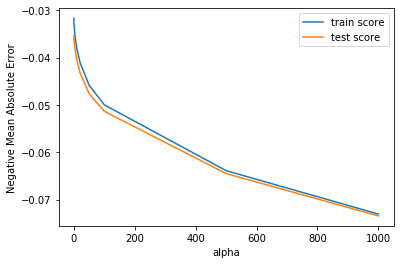

In [5344]:
# plotting mean test and train scoes with alpha 

ridge_mean['param_alpha'] = ridge_mean['param_alpha'].astype('int32')

plt.plot(ridge_mean['param_alpha'], ridge_mean['mean_train_score'])
plt.plot(ridge_mean['param_alpha'], ridge_mean['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.legend(['train score', 'test score'])
plt.show()

In [5345]:
#  best lambda

ridge_model.best_estimator_

Ridge(alpha=0.0001, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [5346]:
# checking coefficients values of lambda = 0.0001

alpha = 0.0001
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_rfe, y_train)
ridge.coef_

array([ 1.82543652e-01, -1.62964650e-01,  4.20543599e-01,  1.53384667e-02,
        6.18691373e-03,  2.59975254e-02,  1.55846373e-01, -1.43265677e-01,
        2.43794293e-02,  3.27645167e-02,  4.89194834e-02,  5.91952260e-02,
        9.36084991e-02,  1.43150695e-01,  2.17100627e-01,  4.04359244e-02,
        1.36470619e-02,  4.65900925e-02,  7.09631235e-02,  8.91303887e-02,
        1.08542683e-01,  1.17573622e-01,  1.44816276e-01, -1.66019265e-02,
       -2.92634934e-02, -6.39644958e-03, -1.66019265e-02, -1.18325428e-02,
        3.31511560e-02, -2.92634934e-02, -1.13965261e-03, -5.59270169e-03,
        1.74371136e-02,  1.25843792e-03,  8.95694556e-03,  2.24057217e-02,
       -9.44055135e-03,  4.16815727e-03,  2.67742293e-05, -7.13698843e-03,
       -4.94419146e-02,  1.67012166e-02,  1.49262721e-02,  2.57640958e-02,
       -2.76304123e-04,  4.67880011e-03, -1.23521655e-02,  1.15515627e-02,
       -2.73420036e-03, -1.78213053e-02, -3.15762639e-02, -2.36987502e-02,
       -4.39861406e-02,  

In [5347]:
#Checking r2 of the model for train data
print(r2_score(y_train,ridge.predict(X_train_rfe)))

0.8741246982505162


In [5348]:
#Checking r2 of the model for test data
print(r2_score(y_test, ridge.predict(X_test_rfe)))

0.829789553366384


In [5349]:
#Calculating the mean square error vale
mean_squared_error(y_test, ridge.predict(X_test_rfe))


0.0029633773451092724

In [5350]:
# Putting the Features and coefficienst into a dataframe

r_df = pd.DataFrame({'Features':X_train_rfe.columns, 'Coefficient':ridge.coef_.round(4)})
r_df.reset_index(drop=True, inplace=True)
r_df

,Features,Coefficient
0,LotArea,0.1825
1,NoOfYears,-0.1630
2,GrLivArea,0.4205
3,MSSubClass_190,0.0153
4,MSSubClass_90,0.0062
5,MSZoning_FV,0.0260
6,OverallQual_10,0.1558
7,OverallQual_2,-0.1433
8,OverallQual_3,0.0244
9,OverallQual_4,0.0328


In [5351]:
# Creating a dictionary and putting the values of features and coefficients in it

r_coeff_dict = dict(pd.Series(ridge.coef_, index = X_train_rfe.columns))
r_coeff_dict

{'LotArea': 0.18254365231621092,
 'NoOfYears': -0.16296464981930514,
 'GrLivArea': 0.42054359868193886,
 'MSSubClass_190': 0.015338466667978015,
 'MSSubClass_90': 0.0061869137335156844,
 'MSZoning_FV': 0.025997525385959095,
 'OverallQual_10': 0.15584637320116604,
 'OverallQual_2': -0.143265676867197,
 'OverallQual_3': 0.02437942933741754,
 'OverallQual_4': 0.032764516684211605,
 'OverallQual_5': 0.04891948343506776,
 'OverallQual_6': 0.059195225958051136,
 'OverallQual_7': 0.09360849913472354,
 'OverallQual_8': 0.14315069473855543,
 'OverallQual_9': 0.21710062662869076,
 'OverallCond_2': 0.04043592443491068,
 'OverallCond_3': 0.0136470618636668,
 'OverallCond_4': 0.046590092530514826,
 'OverallCond_5': 0.07096312349262512,
 'OverallCond_6': 0.08913038874656289,
 'OverallCond_7': 0.10854268259434947,
 'OverallCond_8': 0.11757362211337995,
 'OverallCond_9': 0.14481627586181406,
 'Exterior1st_AsphShn': -0.01660192650979429,
 'Exterior1st_CBlock': -0.02926349342594182,
 'Exterior2nd_AsbShn

#### RFE

In [5352]:

# Now, again doing RFE for 15 features
X_train_r = X_train_rfe[r_df.Features]

lm = LinearRegression()
lm.fit(X_train_r, y_train)

rfe = RFE(lm, 24)            
rfe = rfe.fit(X_train_r, y_train)


In [5353]:
list(zip(X_train_rfe.columns,rfe.support_,rfe.ranking_))

[('LotArea', False, 55),
 ('NoOfYears', False, 56),
 ('GrLivArea', False, 54),
 ('MSSubClass_190', False, 53),
 ('MSSubClass_90', True, 1),
 ('MSZoning_FV', False, 57),
 ('OverallQual_10', True, 1),
 ('OverallQual_2', False, 8),
 ('OverallQual_3', True, 1),
 ('OverallQual_4', True, 1),
 ('OverallQual_5', True, 1),
 ('OverallQual_6', True, 1),
 ('OverallQual_7', True, 1),
 ('OverallQual_8', True, 1),
 ('OverallQual_9', True, 1),
 ('OverallCond_2', False, 2),
 ('OverallCond_3', True, 1),
 ('OverallCond_4', True, 1),
 ('OverallCond_5', False, 3),
 ('OverallCond_6', False, 4),
 ('OverallCond_7', False, 6),
 ('OverallCond_8', False, 5),
 ('OverallCond_9', False, 7),
 ('Exterior1st_AsphShn', False, 13),
 ('Exterior1st_CBlock', False, 16),
 ('Exterior2nd_AsbShng', False, 46),
 ('Exterior2nd_AsphShn', False, 14),
 ('Exterior2nd_Brk Cmn', False, 43),
 ('Exterior2nd_BrkFace', False, 34),
 ('Exterior2nd_CBlock', False, 15),
 ('Exterior2nd_CmentBd', False, 42),
 ('Exterior2nd_HdBoard', False, 40),

In [5354]:
#getting the coefficient values

def find(x):
    return r_coeff_dict[x]

# Fetch top 10 features

new_df = pd.DataFrame(list(zip( X_train_r.columns, rfe.support_, rfe.ranking_)), columns=['Features', 'rfe_support', 'rfe_ranking'])
new_df = new_df.loc[new_df['rfe_support'] == True]
new_df.reset_index(drop=True, inplace=True)

new_df['Coefficient'] = new_df['Features'].apply(find)
new_df = new_df.sort_values(by=['Coefficient'], ascending=False)
new_df = new_df.head(10)
new_df

,Features,rfe_support,rfe_ranking,Coefficient
8,OverallQual_9,True,1,0.217101
1,OverallQual_10,True,1,0.155846
7,OverallQual_8,True,1,0.143151
6,OverallQual_7,True,1,0.093608
5,OverallQual_6,True,1,0.059195
4,OverallQual_5,True,1,0.048919
10,OverallCond_4,True,1,0.046590
3,OverallQual_4,True,1,0.032765
14,BsmtFinType1_GLQ,True,1,0.025764
2,OverallQual_3,True,1,0.024379


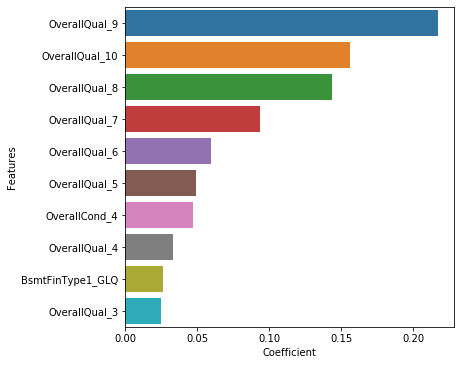

In [5355]:
#Plotting graph of top 10 features that are affecting the SalePrice
plt.figure(figsize=(20,20))
plt.subplot(3,3,1)
sns.barplot(y = 'Features', x='Coefficient', data = new_df)
plt.show()

#### Analysis

As we can see we got top 10 features given by ridge resression, this is given on the basis of coefficients value <br>
The most import feature is OverallQuality 

#### Lasso

In [5356]:
lasso = Lasso()

# list of alphas

params = {'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.001, 0.002, 0.003, 0.004, 0.005, 0.01]}

# cross validation

folds = 5
lasso_model = GridSearchCV(estimator = lasso,                         
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model.fit(X_train_rfe, y_train)

Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    0.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005,
                                   0.001, 0.002, 0.003, 0.004, 0.005, 0.01]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [5357]:
# checking mean values for train ans test data

lasso_mean = pd.DataFrame(lasso_model.cv_results_)
lasso_mean[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by = ['rank_test_score'])

,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,-0.032211,-0.035181,1
1,0.0002,-0.032707,-0.035255,2
2,0.0003,-0.033414,-0.035682,3
3,0.0004,-0.034162,-0.036110,4
4,0.0005,-0.034896,-0.036756,5
5,0.001,-0.038187,-0.039826,6
6,0.002,-0.043985,-0.045393,7
7,0.003,-0.049279,-0.050731,8
8,0.004,-0.054804,-0.056195,9
9,0.005,-0.059138,-0.060192,10


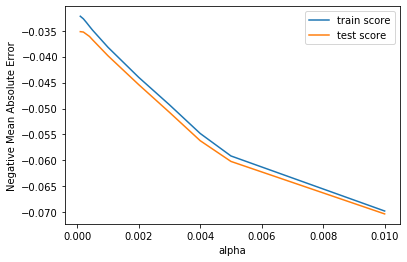

In [5358]:
# plotting graph 

lasso_mean['param_alpha'] = lasso_mean['param_alpha'].astype('float64')


plt.plot(lasso_mean['param_alpha'], lasso_mean['mean_train_score'])
plt.plot(lasso_mean['param_alpha'], lasso_mean['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [5359]:
# getting the estimator of lambda

lasso_model.best_estimator_

Lasso(alpha=0.0001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [5360]:

# checking the coefficient values with lambda = 0.0001

alpha = 0.0001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_rfe, y_train) 
lasso.coef_

array([ 1.47441837e-01, -1.58743587e-01,  4.00729138e-01,  0.00000000e+00,
        0.00000000e+00,  2.17498813e-02,  1.00787442e-01, -1.38423310e-01,
       -2.54497192e-02, -2.14882506e-02, -4.30062073e-03,  4.74012822e-03,
        3.97930652e-02,  8.90431533e-02,  1.58145746e-01, -0.00000000e+00,
       -5.71520101e-02, -1.97253453e-02, -0.00000000e+00,  1.63874979e-02,
        3.59340675e-02,  4.29745969e-02,  7.10312978e-02, -0.00000000e+00,
       -0.00000000e+00, -3.68960571e-03, -0.00000000e+00, -0.00000000e+00,
        3.09246903e-02, -0.00000000e+00, -0.00000000e+00, -3.10557198e-03,
        5.61667527e-03,  1.53677239e-03,  1.01872116e-02,  0.00000000e+00,
       -6.14046734e-03,  5.80373855e-03, -0.00000000e+00, -3.15796932e-03,
       -4.98870761e-02,  1.22097089e-02,  8.81464926e-03,  2.40136719e-02,
       -3.21666719e-04,  0.00000000e+00, -1.51763569e-02,  6.61354892e-03,
        0.00000000e+00,  0.00000000e+00, -9.45549370e-03, -9.30577757e-04,
       -1.39706268e-02,  

In [5361]:
#Calculating r2 for train data
print(r2_score(y_train,lasso.predict(X_train_rfe)))

0.8706099341507296


In [5362]:
#Calculating r2 for test data
print(r2_score(y_test, lasso.predict(X_test_rfe)))

0.8336132779242578


In [5363]:
# Checking the value of mean squared error
mean_squared_error(y_test, lasso.predict(X_test_rfe))


0.002896805997974912

In [5364]:
# Putting the  coefficienst Features and into a dataframe

l_df = pd.DataFrame({'Features':X_train_rfe.columns, 'Coefficient':lasso.coef_.round(4)})
l_df = l_df[l_df['Coefficient'] != 0.00]
l_df.reset_index(drop=True, inplace=True)
l_df

,Features,Coefficient
0,LotArea,0.1474
1,NoOfYears,-0.1587
2,GrLivArea,0.4007
3,MSZoning_FV,0.0217
4,OverallQual_10,0.1008
5,OverallQual_2,-0.1384
6,OverallQual_3,-0.0254
7,OverallQual_4,-0.0215
8,OverallQual_5,-0.0043
9,OverallQual_6,0.0047


In [5365]:
#Putting the above data in dictionary

l_coeff_dict = dict(pd.Series(lasso.coef_, index = X_train_rfe.columns))
l_coeff_dict

{'LotArea': 0.14744183715877318,
 'NoOfYears': -0.15874358666300048,
 'GrLivArea': 0.4007291383299839,
 'MSSubClass_190': 0.0,
 'MSSubClass_90': 0.0,
 'MSZoning_FV': 0.021749881291386462,
 'OverallQual_10': 0.10078744194776856,
 'OverallQual_2': -0.13842330963345081,
 'OverallQual_3': -0.02544971924770031,
 'OverallQual_4': -0.02148825063995957,
 'OverallQual_5': -0.004300620734474293,
 'OverallQual_6': 0.004740128224569392,
 'OverallQual_7': 0.03979306523410849,
 'OverallQual_8': 0.08904315330471624,
 'OverallQual_9': 0.15814574555713137,
 'OverallCond_2': -0.0,
 'OverallCond_3': -0.05715201005230753,
 'OverallCond_4': -0.019725345341111183,
 'OverallCond_5': -0.0,
 'OverallCond_6': 0.01638749789950267,
 'OverallCond_7': 0.03593406745011762,
 'OverallCond_8': 0.04297459686308833,
 'OverallCond_9': 0.07103129784102405,
 'Exterior1st_AsphShn': -0.0,
 'Exterior1st_CBlock': -0.0,
 'Exterior2nd_AsbShng': -0.0036896057130853125,
 'Exterior2nd_AsphShn': -0.0,
 'Exterior2nd_Brk Cmn': -0.0,
 '

#### RFE

In [5366]:
#  features minimization to 22

X_train_l = X_train_rfe[l_df.Features]

lm = LinearRegression()
lm.fit(X_train_l, y_train)

# running RFE

rfe = RFE(lm, 24)            
rfe = rfe.fit(X_train_l, y_train)

In [5367]:
list(zip(X_train_rfe.columns,rfe.support_,rfe.ranking_))

[('LotArea', True, 1),
 ('NoOfYears', True, 1),
 ('GrLivArea', True, 1),
 ('MSSubClass_190', False, 8),
 ('MSSubClass_90', True, 1),
 ('MSZoning_FV', True, 1),
 ('OverallQual_10', True, 1),
 ('OverallQual_2', True, 1),
 ('OverallQual_3', True, 1),
 ('OverallQual_4', True, 1),
 ('OverallQual_5', True, 1),
 ('OverallQual_6', True, 1),
 ('OverallQual_7', True, 1),
 ('OverallQual_8', True, 1),
 ('OverallQual_9', False, 2),
 ('OverallCond_2', False, 11),
 ('OverallCond_3', True, 1),
 ('OverallCond_4', True, 1),
 ('OverallCond_5', True, 1),
 ('OverallCond_6', False, 24),
 ('OverallCond_7', True, 1),
 ('OverallCond_8', False, 22),
 ('OverallCond_9', False, 14),
 ('Exterior1st_AsphShn', False, 36),
 ('Exterior1st_CBlock', False, 27),
 ('Exterior2nd_AsbShng', False, 21),
 ('Exterior2nd_AsphShn', False, 34),
 ('Exterior2nd_Brk Cmn', False, 23),
 ('Exterior2nd_BrkFace', True, 1),
 ('Exterior2nd_CBlock', False, 16),
 ('Exterior2nd_CmentBd', False, 17),
 ('Exterior2nd_HdBoard', False, 15),
 ('Exter

In [5368]:
# Getting coefficient values
def find(x):
    return l_coeff_dict[x]

# Assign top 10 features to a temp dataframe for further display in the bar plot

new2_df = pd.DataFrame(list(zip( X_train_l.columns, rfe.support_, rfe.ranking_)), columns=['Features', 'rfe_support', 'rfe_ranking'])
new2_df = new2_df.loc[new2_df['rfe_support'] == True]
new2_df.reset_index(drop=True, inplace=True)

new2_df['Coefficient'] = new2_df['Features'].apply(find)
new2_df = new2_df.sort_values(by=['Coefficient'], ascending=False)
new2_df = new2_df.head(10)
new2_df

,Features,rfe_support,rfe_ranking,Coefficient
2,GrLivArea,True,1,0.400729
11,OverallQual_9,True,1,0.158146
0,LotArea,True,1,0.147442
3,OverallQual_10,True,1,0.100787
10,OverallQual_8,True,1,0.089043
15,OverallCond_9,True,1,0.071031
14,OverallCond_8,True,1,0.042975
9,OverallQual_7,True,1,0.039793
13,OverallCond_7,True,1,0.035934
16,Exterior2nd_BrkFace,True,1,0.030925


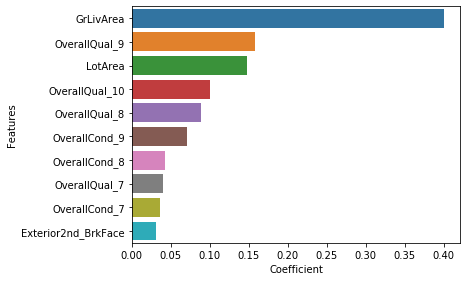

In [5369]:
# plotting the graph for top 10 features

plt.figure(figsize=(20,20))
plt.subplot(4,3,1)
sns.barplot(y = 'Features', x='Coefficient', data = new2_df)
plt.show()

#### Analysis
As we can see in the above graph we got top 10 features on the basis of its coeffients value
<br> GrLivArea is the most important factor followed by OverallQuality and others

### Conclusion

The Error values for - <br>
Ridge - 0.003 <br>
Lasso - 0.002 <br>

The r2 for Lasso 83% for test data which is better than r2 82% given by ridge

As, lasso has feature selection therefore, the error is less as compared to ridge and we consider the factors given by lasso slightly better than ridge
